# Phase coherence classifier for multivariate nonlinear time series based on ordinal partition transition network topology

In [8]:
import mne
from random import randrange
from time import time
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
import dionysus as d
from scipy.signal import resample
from scipy.stats import mannwhitneyu
from mne.preprocessing import create_ecg_epochs
from mne import rename_channels, set_bipolar_reference, read_epochs
from mne.io import read_raw_edf, read_raw_fif
from mne.preprocessing import ICA, read_ica
from pandas import concat, read_csv, set_option
from mne.preprocessing.ica import corrmap 
import multiprocessing
from pickle import dump, load
from pykalman import KalmanFilter
from numpy import ma, zeros, unique, fromiter
from pandas import read_hdf, factorize, DataFrame
from networkx import Graph, draw, all_pairs_shortest_path_length, \
        find_cliques, nx_agraph, contracted_nodes
from networkx.relabel import convert_node_labels_to_integers
import networkx as nx
from operator import itemgetter
from copy import deepcopy
from ripser import ripser
from persim import plot_diagrams, PersImage
from mpl_toolkits.mplot3d import Axes3D
from pandas import DataFrame
from itertools import chain, starmap
from math import ceil, factorial
from scipy.stats import norm
import itertools
from pyentrp import entropy as ent
from functools import reduce
from scipy.integrate import solve_ivp
from mlxtend.evaluate import permutation_test
from numpy import random

from IPython.core.interactiveshell import InteractiveShell
from IPython.core.display import display, HTML, Javascript
# format notebook output
InteractiveShell.ast_node_interactivity = "all"
display(HTML("<style>.container { width:90% !important; }</style>"))
# style pandas display
set_option('display.max_columns', None)
plt.rcParams['figure.dpi']= 300
plt.rcParams['figure.figsize'] = [12, 5]  
plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.labelsize'] = 'x-small'
plt.rcParams['ytick.labelsize'] = 'x-small'
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False

class ICAtemplateMatch:
    def __init__(self, templates, threshold=0.8):
        self.threshold = threshold
        self.templates = templates
    def __str__(self):
        templates = [(x, self.templates[x]['recording'], self.templates[x]['indices']) 
                     for x in ('muscular', 'vertEye', 'horizEye')]
        return '\nTemplate matcher:'                                                      + '\n' + \
               'Template matching algorithm: CORRMAP, threshold: ' + str(self.threshold)  + '\n' + \
               'Templates:\n'                                      + str(templates)       + '\n'
    def find_bads_EOG_EMG(self, icas):
        refs = (('muscular', self.templates['muscular']['ica'], self.templates['muscular']['indices']),
                ('ocular',   self.templates['vertEye']['ica'],  self.templates['vertEye']['indices']),
                ('ocular',   self.templates['horizEye']['ica'], self.templates['horizEye']['indices']))
        indsBads = numBads = []
        for badsLabel, template, indices in refs:
            for i in indices:
                corrmap([template] + icas, (0, i), threshold=self.threshold, label=badsLabel, 
                        show=False, plot=False)
        return [{l: i.labels_[l] for l in set([badsLabel 
                                               for badsLabel, template, indices in refs])}
                for i in icas]
class ICAfit:
    def __init__(self, EEG, templateMatcher=lambda: None, bandpass=(2, None), 
                 methodICA='picard', montage='standard_1020'):
        eeg = EEG()
        self.info = str(eeg)
        self.epochsECG = eeg.as_epochs()
        self.fileName = 'cache' + str(eeg.recordingNumber)              + \
                        ('template' if templateMatcher is None else '') + \
                        '-ica.fif'
        self.scores = 'cache' + str(eeg.recordingNumber) + '-scores.npy'
        self.methodICA = methodICA
        self.montage = montage
        self.templateMatcher = templateMatcher()
        self.cacheExists = False
        try:
            self.ICA = read_ica(self.fileName)
            self.cacheExists = True
        except:
            raw = eeg.as_raw()
            raw.filter(bandpass[0], bandpass[1])
            raw.set_montage(montage)
            self.ICA = ICA(random_state=1, method=methodICA)
            self.ICA.fit(raw)
            if templateMatcher is None:
                self._save()
    def __str__(self):
        return '\nICA fitter:'                  + '\n' + \
               'Montage : '    + self.montage   + '\n' + \
               'ICA method: '  + self.methodICA + '\n' + \
               'Template matcher: None' if self.templateMatcher is None \
                                        else str(self.templateMatcher) + self.info
    def remove_artifacts(self, raw, badsEOGEMG=None):
        if (badsEOGEMG is not None) and (not self.cacheExists):
            self._exclude(badsEOGEMG)
        self.ICA.apply(raw)
    def label_artifacts(self, thresholdECG, bandpassECG):
        if self.cacheExists:
            try:
                scoresECG = np.load(self.scores, allow_pickle=False)
                badsEOGEMG = {key: self.ICA.labels_[key] for key in ('ocular', 'muscular')}
                badsECG = self.ICA.labels_['ecg']
                return badsEOGEMG, badsECG, scoresECG
            except:
                pass
        badsEOGEMG = self._find_bads_EOG_EMG()
        badsECG, scoresECG = self._find_bads_ECG(thresholdECG, bandpassECG)
        self._exclude(badsEOGEMG)
        self._exclude(badsECG)
        np.save(self.scores, scoresECG, allow_pickle=False)
        self._save()
        return badsEOGEMG, badsECG, scoresECG
    def as_ICA(self):
        return self.ICA.copy()
    def plot_sources(self, dat, picks, exclude, title):
        p, e = self._preprocess_input(picks, exclude)
        if dat is None:
            dat = self.epochsECG.average()
        return self.ICA.plot_sources(dat, p, e, title=title)
    def plot_properties(self, dat, picks):
        p, _ = self._preprocess_input(picks)
        if dat is None:
            dat = self.epochsECG
        return self.ICA.plot_properties(dat, picks=p)
    def plot_components(self, picks, title):
        p, _ = self._preprocess_input(picks)
        return self.ICA.plot_components(picks=p, title=title)
    def plot_overlay(self, dat, picks, exclude, title):
        p, e = self._preprocess_input(picks, exclude)
        if dat is None:
            dat = self.epochsECG.average()
        return self.ICA.plot_overlay(dat, exclude=e, picks=p, title=title)
    def plot_scores(self, scores, indices, threshold, title):
        _, e = self._preprocess_input(exclude=indices)
        return self.ICA.plot_scores(scores, exclude=e, axhline=threshold, title=title)
    def _preprocess_input(self, picks=None, exclude=None):
        return (None if picks == [] else picks, 
                None if exclude == [] else exclude)
    def _exclude(self, bads):
        # list(set()) not necessary but good practice in case implementation of
        # mne.preprocessing.ICA.apply() changes in the future
        self.ICA.exclude = list(set(self.ICA.exclude + 
                                    [indices 
                                     for badsList in bads.values() 
                                     for indices in badsList] if type(bads) is dict else bads))
    def _find_bads_EOG_EMG(self):
        if self.templateMatcher is None:
            return {}
        bads = self.templateMatcher.find_bads_EOG_EMG([self.as_ICA()])[0]
        return bads
    def _find_bads_ECG(self, threshold, bandpass, maxRejects=3):
        indsECG, scoresECG = self.ICA.find_bads_ecg(self.epochsECG, threshold=threshold,
                                                    l_freq=bandpass[0], h_freq=bandpass[1])
        badsECG = indsECG[:maxRejects]
        return badsECG, scoresECG
    def _save(self):
        self.ICA.save(self.fileName)
class EEGremoveArtifacts:
    def __init__(self, ICAfit):
        self.ICAfit = ICAfit()
        self.badsEOGEMG, self.badsECG, self.scoresECG, self.thresholdECG = \
                self._label_artifacts()
    def __str__(self):
        return '\nArtifact remover:'                                    + '\n' + \
               'CTPS significance threshold: ' + str(self.thresholdECG) + '\n' + \
               'ECG ICA bad parts: '           + str(self.badsECG)      + '\n' + \
               'EOG/EMG ICA bad parts: '       + str(self.badsEOGEMG)   + '\n' + \
                str(self.ICAfit)
    def remove_artifacts(self, raw, badsEOGEMG=None):
        if badsEOGEMG is not None:
            self.badsEOGEMG.update(badsEOGEMG)
        self.ICAfit.remove_artifacts(raw, badsEOGEMG)
    def as_ICA(self):
        return self.ICAfit.as_ICA()
    def plot_sources(self, dat, picks=None, exclude=None, artifactType=None, title=None):
        return self.ICAfit.plot_sources(dat, self.badsEOGEMG.get(artifactType, picks), 
                                        exclude, title)
    def plot_components(self, picks=None, artifactType=None, title=None):
        return self.ICAfit.plot_components(self.badsEOGEMG.get(artifactType, picks), title)
    def plot_overlay(self, dat, picks=None, exclude=None, artifactType=None, title=None):
        return self.ICAfit.plot_overlay(dat, picks, self.badsEOGEMG.get(artifactType, exclude),
                                        title)
    def plot_properties(self, dat, picks=None, artifactType=None):
        return self.ICAfit.plot_properties(dat, self.badsEOGEMG.get(artifactType, picks))
    def plot_ECG_sources(self, dat, title):
        return self.plot_sources(dat, picks=self.badsECG, title=title)
    def plot_EOG_sources(self, dat, title):
        return self.plot_sources(dat, artifactType='ocular', title=title)
    def plot_EMG_sources(self, dat, title):
        return self.plot_sources(dat, artifactType='muscular', title=title)
    def plot_EOG_overlay(self, dat, title):
        return self.plot_overlay(dat, artifactType='ocular', title=title)
    def plot_EMG_overlay(self, dat, title):
        return self.plot_overlay(dat, artifactType='muscular', title=title)
    def plot_ECG_overlay(self, title):
        return self.plot_overlay(None, exclude=self.badsECG, title=title)
    def plot_EOG_components(self, title):
        return self.plot_components(artifactType='ocular', title=title)
    def plot_EMG_components(self, title):
        return self.plot_components(artifactType='muscular', title=title)
    def plot_ECG_components(self, title):
        return self.plot_components(self.badsECG, title=title)
    def plot_EOG_properties(self, dat):
        return self.plot_properties(dat, artifactType='ocular')
    def plot_EMG_properties(self, dat):
        return self.plot_properties(dat, artifactType='muscular')
    def plot_ECG_properties(self):
        return self.plot_properties(None, self.badsECG)
    def plot_ECG_scores(self, title):
        return self.ICAfit.plot_scores(self.scoresECG, self.badsECG, self.thresholdECG, title=title)
    def plot_ECG_average(self, title):
        return self.plot_sources(None, exclude=self.badsECG, title=title)
    def _label_artifacts(self, threshold=0.45, bandpass=(10, 20)):
        badsEOGEMG, badsECG, scoresECG = self.ICAfit.label_artifacts(threshold, bandpass)
        return badsEOGEMG, badsECG, scoresECG, threshold
class EEGpreprocess:
    def __init__(self, EEG, artifactRemover, badsEOGEMG=None, bipolar=True):
        eeg = EEG()
        self.info = str(eeg)
        fileName = 'cache' + str(eeg.recordingNumber) + '-df.h5'
        try:
            self.annotated = read_hdf(fileName, 'table')
            self.info += 'cache: ' + fileName + '\n'
        except:
            aR = artifactRemover()
            self.info += str(aR)
            raw = eeg.as_raw()
            aR.remove_artifacts(raw, badsEOGEMG)
            if bipolar:
                self._bipolar_montage(raw)
            self.annotated = self._as_annotated(raw, eeg.recordingNumber, eeg.sampleRate)
            self.annotated.to_hdf(fileName, 'table')
    def __str__(self):
        return '\nEEG preprocessor:\n' + self.info
    def _bipolar_montage(self, raw,
        anode = [
          'Fp2', 'F4', 'C4', 'P4', 'Fp1', 'F3', 'C3',
          'P3', 'Fp2', 'F8', 'T4', 'T6', 'Fp1', 'F7',
          'T3', 'T5', 'Fz', 'Cz'
        ],
        cathode = [
          'F4', 'C4', 'P4', 'O2', 'F3', 'C3', 'P3',
          'O1', 'F8', 'T4', 'T6', 'O2', 'F7', 'T3',
          'T5', 'O1', 'Cz', 'Pz'
        ]):
        set_bipolar_reference(raw, anode, cathode, copy=False)
    def _as_annotated(self, raw, recordingNumber, sampleRate, nExperts=3):
        n = len(raw)
        annotated = ma.array(zeros((n, nExperts)), mask=[[True] * nExperts] * n)
        experts = ('A', 'B', 'C')
        # read expert annotations
        annotations = concat([read_csv('annotations_2017_' + expert + '.csv').fillna(0)
                              for expert in experts], 
                             axis=1, keys=experts, names=('Expert', 'Seconds'))
        recordingAnnotations = concat([annotations[expert][str(recordingNumber)] 
                                       for expert in experts], axis=1).values
        # 1 Hz to 85 Hz with masked values in between 1 Hz samples
        annotated[0] = recordingAnnotations[0]
        for i in range(1, n // sampleRate):
            annotated[i * sampleRate - 1] = recordingAnnotations[i]
        # Combine observers using Kalman smoother
        df = raw.to_data_frame()
        df.drop('STI 014', axis=1, inplace=True)
        df['Annotation'], _ = KalmanFilter(initial_state_mean=0, 
                                           n_dim_obs=nExperts).smooth(annotated)
        return df
class EEGread:
    def __init__(self, recordingNumber):
        self.recordingNumber = recordingNumber
        self.fileName = 'cache' + str(recordingNumber) + '-epo.fif'
        self.raw = read_raw_edf('eeg' + str(recordingNumber) + '.edf', preload=True)
        self._rename_EEG_channels()
        self._set_ECG_channel()
        self.sampleRate, self.bandpass = self._downsample()
    def __str__(self):
        return '\nEEG reader:'                                           + '\n'     + \
               'Recording #: '               + str(self.recordingNumber) + '\n'     + \
               'Low pass filter cutoff: '    + str(self.bandpass[0])     + '\n'     + \
               'High pass filter cutoff: '   + str(self.bandpass[1])     + '\n'     + \
               'Downsampled from 256 Hz to ' + str(self.sampleRate)      + ' Hz \n'
    def as_epochs(self, window=(-0.25, 0.25), bandpass=(10, 20)):
        try:
            epochs = read_epochs(self.fileName)
        except:
            epochs = create_ecg_epochs(self.raw, baseline=(None, None), 
                                       tmin=window[0], tmax=window[1], 
                                       l_freq=bandpass[0], h_freq=bandpass[1])
            epochs.save(self.fileName)
        return epochs
    def as_raw(self):
        raw = self.raw.copy()
        raw.drop_channels(['ECG']) 
        return raw
    def _downsample(self, bandpassEEG=(0.5, 34), safetyFactor=1.25): # 256 to 85 Hz
        newSampleRate = int(2 * bandpassEEG[1] * safetyFactor) 
        self.raw.filter(bandpassEEG[0], bandpassEEG[1])
        self.raw.resample(newSampleRate, npad='auto')
        return newSampleRate, bandpassEEG
    def _rename_EEG_channels(self, 
            chanMap1={
                'EEG Fp2-Ref': 'Fp2', 'EEG F4-Ref': 'F4',   'EEG C4-Ref': 'C4',
                'EEG P4-Ref': 'P4',   'EEG Fp1-Ref': 'Fp1', 'EEG F3-Ref': 'F3',
                'EEG C3-Ref': 'C3',   'EEG P3-Ref': 'P3',   'EEG Fp2-Ref': 'Fp2',
                'EEG F8-Ref': 'F8',   'EEG T4-Ref': 'T4',   'EEG T6-Ref': 'T6',
                'EEG Fp1-Ref': 'Fp1', 'EEG F7-Ref': 'F7',   'EEG T3-Ref': 'T3',
                'EEG T5-Ref': 'T5',   'EEG Fz-Ref': 'Fz',   'EEG Cz-Ref': 'Cz',
                'EEG F4-Ref': 'F4',   'EEG C4-Ref': 'C4',   'EEG P4-Ref': 'P4',
                'EEG O2-Ref': 'O2',   'EEG F3-Ref': 'F3',   'EEG C3-Ref': 'C3',
                'EEG P3-Ref': 'P3',   'EEG O1-Ref': 'O1',   'EEG F8-Ref': 'F8',
                'EEG T4-Ref': 'T4',   'EEG T6-Ref': 'T6',   'EEG O2-Ref': 'O2',
                'EEG F7-Ref': 'F7',   'EEG T3-Ref': 'T3',   'EEG T5-Ref': 'T5',
                'EEG O1-Ref': 'O1',   'EEG Cz-Ref': 'Cz',   'EEG Pz-Ref': 'Pz'
            }, 
            chanMap2={
                'EEG Fp2-REF': 'Fp2', 'EEG F4-REF': 'F4',   'EEG C4-REF': 'C4',
                'EEG P4-REF': 'P4',   'EEG Fp1-REF': 'Fp1', 'EEG F3-REF': 'F3',
                'EEG C3-REF': 'C3',   'EEG P3-REF': 'P3',   'EEG Fp2-REF': 'Fp2',
                'EEG F8-REF': 'F8',   'EEG T4-REF': 'T4',   'EEG T6-REF': 'T6',
                'EEG Fp1-REF': 'Fp1', 'EEG F7-REF': 'F7',   'EEG T3-REF': 'T3',
                'EEG T5-REF': 'T5',   'EEG Fz-REF': 'Fz',   'EEG Cz-REF': 'Cz',
                'EEG F4-REF': 'F4',   'EEG C4-REF': 'C4',   'EEG P4-REF': 'P4',
                'EEG O2-REF': 'O2',   'EEG F3-REF': 'F3',   'EEG C3-REF': 'C3',
                'EEG P3-REF': 'P3',   'EEG O1-REF': 'O1',   'EEG F8-REF': 'F8',
                'EEG T4-REF': 'T4',   'EEG T6-REF': 'T6',   'EEG O2-REF': 'O2',
                'EEG F7-REF': 'F7',   'EEG T3-REF': 'T3',   'EEG T5-REF': 'T5',
                'EEG O1-REF': 'O1',   'EEG Cz-REF': 'Cz',   'EEG Pz-REF': 'Pz'
            }):
        try:
            rename_channels(self.raw.info, chanMap1)
        except:
            rename_channels(self.raw.info, chanMap2)
    def _set_ECG_channel(self,  
                         chanECG1={'ECG EKG': 'ECG'}, 
                         chanECG2={'ECG EKG-REF': 'ECG'},
                         typeECG={'ECG': 'ecg'}):
        try:
            rename_channels(self.raw.info, chanECG1)
        except:
            rename_channels(self.raw.info, chanECG2)
        self.raw.set_channel_types(mapping=typeECG)
class EEGplot:
    def __init__(self, EEG, artifactRemover):
        eeg = EEG()
        self.info = str(eeg)
        self.raw = eeg.as_raw()
        self.artifactRemover = artifactRemover()
    def __str__(self):
        return '\nEEG plotter:\n' + str(self.artifactRemover) + self.info
    def plot_sources(self, picks=None, title='Time domain plot of ICA components'):
        return self.artifactRemover.plot_sources(self.raw, picks, title=title)
    def plot_overlay(self, picks=None, title='The effect of ICA component removal'):
        return self.artifactRemover.plot_overlay(self.raw, picks, title=title)
    def plot_components(self, picks=None, title='Topographic plot of ICA components'):
        return self.artifactRemover.plot_components(picks, title=title)
    def plot_ECG_sources(self, title='Time domain plot of cardiac ICA components'):
        return self.artifactRemover.plot_ECG_sources(self.raw, title=title)
    def plot_EOG_sources(self, title='Time domain plot of ocular ICA components'):
        return self.artifactRemover.plot_EOG_sources(self.raw, title=title)
    def plot_EMG_sources(self, title='Time domain plot of muscular ICA components'):
        return self.artifactRemover.plot_EMG_sources(self.raw, title=title)
    def plot_ECG_components(self, picks=None, title='Topographic plot of cardiac ICA components'):
        return self.artifactRemover.plot_ECG_components(title)
    def plot_EOG_components(self, picks=None, title='Topographic plot of ocular ICA components'):
        return self.artifactRemover.plot_EOG_components(title)
    def plot_EMG_components(self, picks=None, title='Topographic plot of muscular ICA components'):
        return self.artifactRemover.plot_EMG_components(title)
    def plot_properties(self, picks=None):
        return self.artifactRemover.plot_properties(self.raw, picks)
    def plot_ECG_overlay(self, title='The effect of cardiac ICA component removal'):
        return self.artifactRemover.plot_ECG_overlay(title)
    def plot_EOG_overlay(self, title='The effect of ocular ICA component removal'):
        return self.artifactRemover.plot_EOG_overlay(self.raw, title)
    def plot_EMG_overlay(self, title='The effect of muscular ICA component removal'):
        return self.artifactRemover.plot_EMG_overlay(self.raw, title)
    def plot_EOG_properties(self):
        return self.artifactRemover.plot_EOG_properties(self.raw)
    def plot_EMG_properties(self):
        return self.artifactRemover.plot_EMG_properties(self.raw)
    def plot_ECG_properties(self):
        return self.artifactRemover.plot_ECG_properties()
    def plot_ECG_scores(self, title='CTPS Significance of ECG ICA Components'):
        return self.artifactRemover.plot_ECG_scores(title)
    def plot_ECG_average(self, title='Average ECG signal vs ECG ICA components'):
        return self.artifactRemover.plot_ECG_average(title)
class PhaseDiagram:
    def __init__(self, x, scale=1, step=1, wLen=(85 // 2, 85 * 2), 
                 order=4, nChannels=5, scaleWindows=True, singleChannel=False):
        self.annotations = x['Annotation'].values.round()
        self.eeg = {i: DataFrame({ch : np.mean(np.reshape(x[ch].values[0 : (len(x) // i) * i], 
                                                          ((len(x) // i), i)), 
                                               axis=1) 
                                  for ch in list(x)[:-1]})
                    for  i in range(1, scale + 1, step)}
        self.wLen, self.step, self.scale, self.order, self.nChannels, self.singleChannel = \
                wLen, step, scale, order, nChannels, singleChannel
        self.finalWindow = (len(x) - 1 - self.wLen[1], len(x) - 1)
        self.scaleWindows = scaleWindows
    def __len__(self):
        return len(self.eeg[1])
    def __call__(self, window):
        return [(window[0], barcode[2], barcode[1]) for barcode in 
                self.multiscale_phase_diagram(window 
                                              if window[0] <= self.finalWindow[0] 
                                              else self.finalWindow)]
    def diagram(self, M, indices=None, annotations=True):
        fig = plt.figure()
        ax = Axes3D(fig)
        marker = '.'
        cmap = plt.get_cmap('copper')
        ax.scatter(M.T[0], M.T[1], M.T[2], 
                   c=[self.annotations[int(i)] for i in M.T[0]] if annotations else None,
                   marker=marker, cmap=cmap)
        seizure = mlines.Line2D([], [], color=cmap(1.), marker=marker, linestyle='None',
                                label='Seizure')
        healthy = mlines.Line2D([], [], color=cmap(0.), marker=marker, linestyle='None',
                                label='Healthy')
        ax.legend(handles=[seizure, healthy])
        ax.set_title("Order " + str(self.order) + " classifier")
        ax.set_xlabel("Time (ms)")
        ax.set_ylabel("Number of channels")
        ax.set_zlabel("Persistence")
        return M, fig, ax
    def plot_subset(self, M, nChannels=5):
        df = DataFrame(M)
        subset = df[df[1]==nChannels].values.T
        fig, ax = plt.subplots()
        cmap = plt.get_cmap('flag')
        marker = 'x'
        scatter = ax.scatter(subset[0], subset[2], 
                             c=[1 - self.annotations[int(i)] for i in subset[0]],
                             marker=marker, cmap=cmap)
        seizure = mlines.Line2D([], [], color=cmap(0.), marker=marker, linestyle='None',
                                label='Seizure')
        healthy = mlines.Line2D([], [], color=cmap(1.), marker=marker, linestyle='None',
                                label='Healthy')
        ax.legend(handles=[seizure, healthy])
        ax.set_title("Classifier using " + str(nChannels) + " channels")
        ax.set_xlabel("Time (ms)")
        ax.set_ylabel("Persistence")
        return subset.T, fig, ax    
    def plot(self, start=0, annotations=True):
        with multiprocessing.Pool(processes=multiprocessing.cpu_count()) as p:
            M = np.array(list(chain.from_iterable(p.map(self, ((start + (j - 1) * self.wLen[0], 
                                                                start + (j - 1) * self.wLen[0] + self.wLen[1]) 
                                                               for j in range(1, (len(self) - start) 
                                                                                 // self.wLen[0]))))))
        return self.diagram(M, annotations)
    def get_persistence(self, start=0):
        with multiprocessing.Pool(processes=multiprocessing.cpu_count()) as p:
            M = np.array(list(chain.from_iterable(p.map(self, ((start + (j - 1) * self.wLen[0], 
                                                                start + (j - 1) * self.wLen[0] + self.wLen[1]) 
                                                               for j in range(1, (len(self) - start) 
                                                                                 // self.wLen[0]))))))
        return M
    def vstack(self, x):
        return np.array([]) if x == [] else np.vstack(x)
    def multiscale_phase_diagram(self, window):
        f = lambda i: Symbolize(self.eeg, i, self.order, self.scale, 
                                self.scaleWindows)((window[0], window[1]), 
                                                   self.wLen[0])
        return self.vstack([np.append(barcode, j)
                            for j in range(self.nChannels if self.singleChannel else 3, 
                                           self.nChannels + 1)
                            for i in list(self.eeg) 
                            for barcode in ripser(self._get_distances(f(j)), 
                                                  distance_matrix=True)['dgms'][1]])
    def _get_distances(self, symbolized):
        G = Graph()
        G.add_nodes_from(unique(symbolized))
        G.add_edges_from([(symbolized[i], symbolized[i + 1])
                       for i in range(*((0, len(symbolized) - 1)))])
        G = convert_node_labels_to_integers(G)
        D = np.full((len(G), len(G)), float('inf'))
        for index, distance in [((S[0], s[0]), s[1])
                                for S in all_pairs_shortest_path_length(G)
                                for s in sorted(S[1].items(), key=itemgetter(1))]:
            D[index] = distance
        return D
class Symbolize:
    def __init__(self, annotated, nChannels, order, scale, scaleWindows):
        self.scale = scale
        self.annotated = annotated
        self.order = (order, factorial(order))
        self.nChannels = nChannels
        self.scaleWindows = scaleWindows
    def __call__(self, window, wLen):
        scale = self.scale if self.scaleWindows else 1
        symbolized = self._rank_activity(self.annotated, self.scale,
                                         (window[0] // scale, 
                                          window[1] // scale), 
                                         wLen // scale,
                                         self.nChannels).apply(self._symbolize)
        return factorize(fromiter((hash(tuple(symbolized[ch].values[i] 
                                              for ch in list(symbolized)[:-1]))
                                   for i in range(*((0, len(symbolized) - 1)))), 
                                  int))[0]
    def _rank_activity(self, annotatedList, scale, window, wLen, nMaxChannels, order=3, delay=1):
        F = lambda x: np.argsort(np.array(list(map(lambda channel: 
                                                   ent.permutation_entropy(channel, order, delay), 
                                                   x))).T)[:nMaxChannels]
        channels = list(annotatedList[1])#[:-1]
        activeChannels = [channels[i] 
                          for i in F(annotatedList[1][channels].values[slice(*window)].T)]
        return annotatedList[scale][activeChannels].iloc[slice(window[0], window[0] + wLen), :]
    def _symbolize(self, x, order=None, delay=1):
        o = self.order[0] if order is None else order
        y = np.empty((o, len(x) - delay * (o - 1)))
        for i in range(o):
            y[i] = x[i * delay : i * delay + y.shape[1]]
        return factorize((np.multiply(np.apply_along_axis(self._rank_ordering, 1, y.T), 
                                      np.power(o, np.arange(o)))).sum(1))[0]
    def _rank_ordering(self, row):
        return factorize(-row, sort=True)[0]
class Lazy:
    def __init__(self, f):
        self.f = f
    def __call__(self, x):
        return self.f(lambda: x)
    def map(self, pool, x):
        return pool.map(self, x)
class LazyEEGpreprocess:
    def __init__(self, bipolar):
        self.bipolar = bipolar
    def __call__(self, raw, artifactRemover, bad):
        return EEGpreprocess(lambda: raw, lambda: artifactRemover, bad, self.bipolar)
    def map(self, p, raws, artifactRemovers, bads):
        return p.starmap(self, zip(raws, artifactRemovers, bads))
class LazyEEGplot:
    def __call__(self, eeg, artifactRemover):
        return EEGplot(lambda: eeg, lambda: artifactRemover)
    def map(self, p, raws, artifactRemovers):
        return p.starmap(self, zip(raws, artifactRemovers))
class EEGwrapper:
    def get_templates(self):
        f = lambda n: ICAfit(lambda: EEGread(n)).as_ICA()
        return lambda: ICAtemplateMatch({
            'muscular': {'ica': f(16), 'recording': 16, 'indices': (3, 6)},
            'vertEye':  {'ica': f(43), 'recording': 43, 'indices': (2,)},
            'horizEye': {'ica': f(23), 'recording': 23, 'indices': (15,)}
        })
    def read_EEG(self, recordings, templateMatcher=lambda: None, returnPlotters=True, bipolar=True):
        if type(recordings) is list:
            if len(recordings) > 1:
                return self._read_EEG_range(recordings, templateMatcher, returnPlotters, bipolar)
            recordings = recordings[0]
        return self._read_EEG_single(recordings, templateMatcher, returnPlotters, bipolar)
    def _read_EEG_range(self, recordings, templateMatcher, returnPlotters, bipolar):
        with multiprocessing.Pool(processes=multiprocessing.cpu_count()) as p:
            raws = p.map(EEGread, recordings)
            bads = artifactRemovers = plotters = [None for _ in recordings]
            try:
                for n in recordings:
                    read_hdf('cache' + str(n) + '-df.h5', 'table')
                if returnPlotters:
                    raise Exception()
            except:
                icas = Lazy(ICAfit).map(p, raws)
                bads = templateMatcher().find_bads_EOG_EMG([i.as_ICA() for i in icas])
                artifactRemovers = Lazy(EEGremoveArtifacts).map(p, icas)
                plotters = LazyEEGplot().map(p, raws, artifactRemovers)
            return zip(LazyEEGpreprocess(bipolar).map(p, raws, artifactRemovers, bads), plotters)
    def _read_EEG_single(self, recordingNumber, templateMatcher, returnPlotters, bipolar):
        eeg = lambda: EEGread(recordingNumber)
        artifactRemover = lambda: EEGremoveArtifacts(lambda: ICAfit(eeg, templateMatcher))
        if returnPlotters:
            e = eeg()
            a = artifactRemover()
            return (EEGpreprocess(lambda: e, lambda: a, bipolar=bipolar), 
                    EEGplot(lambda: e, lambda: a))
        return EEGpreprocess(eeg, artifactRemover), None
class Rossler:
    def __init__(self, param=0.165, step=0.05, datapoints=20000, discard=16000, surrogate=False, solution=None):
        self.param = param
        if solution is None:
            sol = solve_ivp(self, [0, step * datapoints], [0.1, 0.1, 0.1], 
                            max_step=step, dense_output=True)
        self.solution = DataFrame({'x':sol.y[0][discard + 1:],
                                   'y':sol.y[1][discard + 1:],
                                   'z':sol.y[2][discard + 1:],
                                   'Annotation': sol.t[discard + 1:]})[['x', 'y', 'z', 'Annotation']] \
                        if solution is None else solution
        if surrogate:
            self.surrogate = Surrogate()(self.solution[['x', 'y', 'z']].values.T)
    def __call__(self, t, r, b=0.4, c=8.5, omega=1):
        x, y, z = r
        a = self.param
        return (-omega * y - z, omega * x + a * y, b + z * (x - c))
    def plot(self, surrogate=False):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        x = self.surrogate[0] if surrogate else self.solution['x'].values
        y = self.surrogate[1] if surrogate else self.solution['y'].values
        z = self.surrogate[2] if surrogate else self.solution['z'].values
        ax.plot(x, y, z)
        ax.set_title(("Surrogate data for a " if surrogate else "") + 
                     "Rossler system with parameter a = "           + str(self.param))
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        ax.set_zlabel("z")
        return fig, ax
    def plot_surrogate(self, component=0):
        x = self.solution['Annotation'].values
        fig, ax = plt.subplots()
        ax.plot(x, self.solution['x'].values, 'k-')
        ax.plot(x, self.surrogate[component], color='gray', linestyle='dotted')
        ax.legend(['Original', 'Surrogate'])
        ax.set_title("Rossler system with parameter a = " + str(self.param))
        ax.set_xlabel("Time (ms)")
        ax.set_ylabel("x-component Amplitude")
        return fig, ax
    def get_persistence(self, surrogate=False, returnFigure=True):
        M = PhaseDiagram(DataFrame({'x': self.surrogate[0], 
                                    'y': self.surrogate[1], 
                                    'z': self.surrogate[2], 
                                    'Annotation': self.solution['Annotation'].values})[['x', 'y', 'z', 
                                                                                        'Annotation']] \
                         if surrogate else self.solution, 
                         wLen=(120, 120), nChannels=3, order=5).get_persistence()
        if returnFigure is False:
            return M
        fig, ax = plt.subplots()
        ax.scatter(M.T[0], M.T[2], marker='x', c='k')
        ax.set_title(("Surrogate data for a " if surrogate else "") + 
                     "Rossler system with parameter a = " + str(self.param))
        ax.set_xlabel("Time (ms)")
        ax.set_ylabel("Persistence")
        return M, fig, ax
class Surrogate:
# http://www.pik-potsdam.de/~donges/pyunicorn/_modules/pyunicorn/timeseries/surrogates.html
    def __call__(self, data):
        # Amplitude adjusted (fourier transform) phase randomized surrogate, as described in Breakspear (2002)
        gaussian = random.randn(data.shape[0], data.shape[1])
        gaussian.sort(axis=1)
        #  Rescale data to Gaussian distribution
        rescaledData = np.zeros(data.shape)
        for i in range(data.shape[0]):
            rescaledData[i, :] = gaussian[i, self._get_ranks(data)[i, :]]
        #  Phase randomize rescaled data
        phaseRandomizedData = self._phase_shuffled_surrogate(rescaledData)
        #  Rescale back to amplitude distribution of original data
        sortedOriginal = data.copy()
        sortedOriginal.sort(axis=1)
        for i in range(data.shape[0]):
            rescaledData[i, :] = sortedOriginal[i, self._get_ranks(phaseRandomizedData)[i, :]]
        return rescaledData
    def _get_ranks(self, data):
        return data.argsort(axis=1).argsort(axis=1)
    def _phase_shuffled_surrogate(self, data):
        (N, nTime) = data.shape
        surrogates = np.fft.rfft(data, axis=1) #  Calculate FFT of original_data time series
        lenPhase = surrogates.shape[1]
        # Generate random phases uniformly distributed in the interval [0, 2*Pi]
        phases = np.random.uniform(low=0, high=2 * np.pi, size=(N, lenPhase))
        # Add random phases uniformly distributed in the interval [0, 2*Pi]
        surrogates *= np.exp(1j * phases) 
        # Calculate IFFT and take the real part, the remaining imaginary part
        # is due to numerical errors.
        return np.ascontiguousarray(np.real(np.fft.irfft(surrogates, n=nTime, axis=1)))
class RosslerStats:
    def __init__(self, window=120):
        self.window = window
    def __call__(self, param, summary=True):
        r = Rossler(param)
        M = PhaseDiagram(r.solution, wLen=(self.window, 
                                           self.window), order=5, nChannels=3).get_persistence()
        return (param, np.median(M.T[2]), np.mean(M.T[2]), np.std(M.T[2]), np.min(M.T[2]), np.max(M.T[2])) \
               if summary else M.T[2]
    def _get_values(self, param):
        return self(param, summary=False)
    def stats_range(self, start=0.15, stop=0.3, num=31):
        stats = np.array(list(map(self, np.linspace(start, stop, num))))
        return stats.T[0], stats.T[1], stats.T[2], stats.T[3], stats.T[4], stats.T[5]
    def values_range(self, start=0.15, stop=0.3, num=31):
        param = np.linspace(start, stop, num)
        return list(param), list(map(self._get_values, param))
    def split(self, param, mean, std, firstHalf=True, c=11): # c chosen so param[c] = 0.205 < 0.206 cutoff
        return (param[0    : c + 1], mean[0 : c + 1], std[0 : c + 1]) if firstHalf else \
               (param[c+ 1 :],       mean[c + 1:],    std[c + 1:])
    def plot1(self, param, median, mins, maxs):
        fig, ax = plt.subplots()
        ax.set_title("Classifier median, maximum, and minimum")
        ax.set_xlabel("Rossler parameter")
        ax.set_ylabel("Persistence")
        ax.errorbar(param, median, yerr=[median - mins, maxs - median], capsize=5, ecolor='lightgray', 
                    mfc='k', mec='k', fmt='o')
        xc = 0.206
        ax.axvline(x=xc, color='k', linestyle='--')
        ax.set_xticks(list(ax.get_xticks()) + [xc])
        return fig, ax
    def plot2(self, param, mean, std):
        fig, ax = plt.subplots()
        ax.set_title("Classifier mean and standard deviation")
        ax.set_xlabel("Rossler parameter")
        ax.set_ylabel("Persistence")
        ax.errorbar(param, mean, yerr=std, capsize=5, ecolor='lightgray', 
                    mfc='k', mec='k', fmt='o')
        xc = 0.206
        ax.axvline(x=xc, color='k', linestyle='--')
        ax.set_xticks(list(ax.get_xticks()) + [xc])
        return fig, ax
class SurrogateSignificance:
    def __init__(self, data, surrogatePersistence, nEpochs=1,
                 winLen=213, nSubjects=1, nIterations=19, alpha=0.05, onlyMean=False):
        self.data, self.nIterations = data, nIterations
        self.persistence = surrogatePersistence
        # Sidak correction. n surrogate + 1 original
        # https://en.wikipedia.org/wiki/%C5%A0id%C3%A1k_correction
        self.alpha            = 1 - (1 - alpha)**(1. /  (nIterations + 1))
        self.alphaSubject     = 1 - (1 - alpha)**(1. / ((nIterations + 1) * nEpochs))
        self.alphaAllSubjects = 1 - (1 - alpha)**(1. / ((nIterations + 1) * nEpochs * nSubjects))
        self.onlyMean = onlyMean
    def __call__(self, dummy):
        M = self.persistence(self.data)
        if self.onlyMean:
            return (np.mean(M.T[2]) if len(M) > 0 else 0, 0)
        return (np.mean(M.T[2]) if len(M) > 0 else 0, 
                np.std(M.T[2])  if len(M) > 0 else 0.1)
    def get_significance(self, M, nonInteractive=False):
        surrogateStats = np.array(list(map(self, range(self.nIterations)))).T
        experimentalMean = np.mean(M.T[2]) if len(M) > 0 else 0
        zMean = (np.mean(surrogateStats[0]) - experimentalMean) / np.std(surrogateStats[0])
        pMean = norm.cdf(zMean)
        if nonInteractive:
            return 0, pMean, 0
        if self.onlyMean:
            return ((self.alpha, self.alphaSubject, self.alphaAllSubjects), 
                    (pMean, 
                     self.alpha            - pMean > 0, 
                     self.alphaSubject     - pMean > 0, 
                     self.alphaAllSubjects - pMean > 0),
                    surrogateStats)
        experimentalStd = np.std(M.T[2]) if len(M) > 0 else 0.1
        zStd  = (np.mean(surrogateStats[1]) - experimentalStd)  / np.std(surrogateStats[1])
        pStd  = norm.cdf(zStd)
        return ((self.alpha, self.alphaSubject, self.alphaAllSubjects), 
                (pMean, 
                 self.alpha            - pMean > 0, 
                 self.alphaSubject     - pMean > 0, 
                 self.alphaAllSubjects - pMean > 0), 
                (pStd, 
                 self.alpha            - pStd > 0,  
                 self.alphaSubject     - pStd > 0, 
                 self.alphaAllSubjects - pStd > 0), 
                surrogateStats)
def eeg_surrogate_test(x, eegIndex, epochIndex=0, nEpochs=40, nSubjects=3, nonInteractive=True):
    # x assumed to be preprocessed (e.g. only seizure epochs in x)
    print("EEG#: " + str(eegIndex) + ", Epoch#: " + str(epochIndex))
    seizureSubset = x[epochIndex * 213 : (epochIndex + 1) * 213]
    p = PhaseDiagram(seizureSubset, singleChannel=True)
    M = p.get_persistence()
    alphaSeizure, pMeanSeizure, surrogateStats = \
        SurrogateSignificance(seizureSubset, get_eeg_surrogate, nSubjects=nSubjects, 
                              nEpochs=nEpochs, onlyMean=True).get_significance(M, nonInteractive)
    if nonInteractive:
        print("p = " + str(pMeanSeizure))
        return eegIndex, epochIndex, pMeanSeizure
    print("EEG index: " + str(eegIndex))
    print("epochIndex index: " + str(epochIndex))
    print("Single iteration: alpha = 0.05")
    print("Single epoch: alpha = " + str(alphaSeizure[0]))
    print("Single subject: alpha = " + str(alphaSeizure[1]))
    print("All subjects: alpha = " + str(alphaSeizure[2]))
    print("p value: " + str(pMeanSeizure[0]))
    print("Null hypothesis rejected? (Uncorrected alpha): " + str(pMeanSeizure[0] < 0.05))
    print("Null hypothesis rejected? (Single epoch): "      + str(pMeanSeizure[1]))
    print("Null hypothesis rejected? (Single subject): "    + str(pMeanSeizure[2]))
    print("Null hypothesis rejected? (All subjects): "      + str(pMeanSeizure[3]))
    return M, pMeanSeizure, alphaSeizure
def get_eeg_surrogate(x):
    seizureSurrogate = dict(zip(list(x)[:-1], Surrogate()(x[list(x)[:-1]].values.T)))
    seizureSurrogate['Annotation'] = x['Annotation']
    return PhaseDiagram(DataFrame(seizureSurrogate)[list(x)]).get_persistence()
def plot_eeg_surrogate(x, index):
    preprocessed = preprocess_eeg(x)
    y = preprocessed[0 : 213]
    seizureSurrogate = dict(zip(list(y)[:-1], Surrogate()(y[list(y)[:-1]].values.T)))
    seizureSurrogate['Annotation'] = y['Annotation']
    df = DataFrame(seizureSurrogate)[list(y)]
    fig, ax = plt.subplots()
    ax.set_title("EEG Subject " + str(index) + " Fp1-F7 Recording")
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Amplitude (μV)")
    ax.plot(y['Fp1-F7'].index.values, y['Fp1-F7'].values, 'k-', label='Original')
    ax.plot(df['Fp1-F7'].index.values, df['Fp1-F7'].values, 
            color='gray', linestyle='dotted', label='Surrogate')
    ax.legend()
    t = time()
    M, pMeanSeizure, alphaSeizure = eeg_surrogate_test(y, index, nonInteractive=False)
    print("Time (s) to perform surrogate test:" + str(time() - t))
    return M, fig, ax
def preprocess_eeg(x):
    inds = np.concatenate(([0], 
                           np.where(np.diff(x[x['Annotation'] 
                                              > 0.8].index.values) 
                                    > 12)[0] + 1))
    
    return concat([x[x['Annotation'] 
                     > 0.8][inds[i] : 
                            inds[i + 1]][:213 
                                         * (inds[i + 1] // 213) 
                                         - inds[i + 1]] 
                   for i in range(len(inds) - 1)])
def read_annotations(threshold=39, numRecordings=79, verbose=False):
    expertAnnotations = concat([read_csv('annotations_2017_' + expert +
                                         '.csv').fillna(0).sum() > threshold
                                for expert in ('A', 'B', 'C')],
                               axis = 1).sum(axis = 1)
    noSeizures = [i + 1 for i in range(numRecordings) if expertAnnotations[i] == 0]
    seizures = [i + 1 for i in range(numRecordings) if expertAnnotations[i] == 3]
    nonConsensus = [i + 1 for i in range(numRecordings) if 0 < expertAnnotations[i] < 3]
    if verbose:
        print("Non-seizure by consensus: " + str(len(noSeizures)))
        print(noSeizures)
        print("--------------------")
        print("Seizure by consensus: " + str(len(seizures)))
        print(seizures)
        print("--------------------")
        print("Non-consensus: " + str(len(nonConsensus)))
        print(nonConsensus)
        print("--------------------")
        print("Total: " + str(len(nonConsensus) + len(seizures) + len(noSeizures)))
    return noSeizures, seizures, nonConsensus
def ordinal_graph(symbolized, window=None, returnGraph=True):
    G = Graph()
    G.add_nodes_from(unique(symbolized))
    G.add_edges_from([(symbolized[i], symbolized[i + 1]) 
                      for i in range(*((0, len(symbolized) - 1)
                                     if window is None else window))])
    graph = deepcopy(G) if returnGraph else None
    shortestPaths = sorted([((S[0],), s[1]) if S[0] is s[0] else ((S[0], s[0]), s[1])
                            for S in all_pairs_shortest_path_length(G) 
                            for s in list(S[1].items())], key=itemgetter(1))
    cliques = [[[n] for n in G.nodes], [list(e) for e in G.edges if e[0] != e[1]]]
    for i, c in enumerate([[s[0] for s in shortestPaths if s[1] is i] 
                           for i in range(2, shortestPaths[-1][1])]):
        G.add_edges_from(c)
        cliques.append([c for c in nx.enumerate_all_cliques(G) 
                        if c not in [c 
                                     for j in range(i + 1) 
                                     for c in cliques[j]]])
    f = d.Filtration()
    for vertices, time in [(c, i) 
                           for i, C in enumerate(cliques) 
                           for c in C]:
        f.append(d.Simplex(vertices, time))
    return f, graph if returnGraph else f
def draw_graph(G, drawLabels=True):
    draw(G, pos=nx_agraph.graphviz_layout(G, prog='neato'), with_labels=drawLabels)
def draw_distances(D, spread=0.0001, resolution=20, drawImage=True):
    f = ripser(D, distance_matrix=True)['dgms']
    if drawImage:
        pim = PersImage(spread=spread, pixels=[resolution, resolution], verbose=False)
        pim.show(pim.transform(f[1]))
        return
    plot_diagrams(ripser(D, distance_matrix=True)['dgms'], [1])
def draw_multiscale_diagram(f):
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.scatter(f.T[0], f.T[1], f.T[2] - f.T[1])
    return fig, ax
def get_seizure_recordings(w, templateMatcher, nEpochs=40, threshold=(40 * 60)):
    _, eegIndices, _ = read_annotations(threshold=threshold) # 40 seizure minutes
    return [(e, i + 1, epochIndex, nEpochs, len(eegIndices))
            for i, e in enumerate(map(lambda x: preprocess_eeg(x[0].annotated), 
                                      list(w.read_EEG(eegIndices + [4, 6, 8, 7, 13], 
                                                      lambda: templateMatcher()))[:len(eegIndices)]))
            for epochIndex in map(lambda x: randrange(len(e) // 213), 
                                  range(nEpochs))]
def test(w, templateMatcher):
    e = templateMatcher()
    eeg13 = w.read_EEG(13, lambda: e)
    eeg7 = w.read_EEG(7, bipolar=False)
    eeg4, eeg5 = w.read_EEG([4, 5], lambda: e)
    eeg6, eeg8 = w.read_EEG([6, 8], lambda: e, returnPlotters=False)

    print(eeg13[0])
    print(eeg13[1])
    eeg13[1].plot_EOG_properties()
    eeg13[1].plot_EOG_sources()
    eeg13[1].plot_EMG_properties()
    eeg13[1].plot_EMG_sources()
    
    print(eeg7[0])
    print(eeg7[1])
    eeg7[1].plot_ECG_components()
    eeg7[1].plot_ECG_overlay()
    eeg7[1].plot_ECG_average()
    eeg7[1].plot_ECG_scores()
    eeg7[1].plot_ECG_sources()
    eeg7[1].plot_ECG_average()
    eeg7[1].plot_ECG_properties()
    
    print(eeg4[0])
    eeg4[1].plot_EMG_components()
    eeg4[1].plot_EMG_overlay()
    eeg4[1].plot_EOG_components()
    eeg4[1].plot_EOG_overlay()
    
    print(eeg5[0])
    eeg5[1].plot_components()
    eeg5[1].plot_sources()
    eeg5[1].plot_overlay()
    eeg5[1].plot_properties()
    plt.plot(eeg5[0].annotated['Annotation'].values)
    
    print(eeg6[0])
    print(eeg6[1])
    print(eeg8[0])
    print(eeg8[1])
        
    return eeg13, eeg7, eeg4, eeg5, eeg6, eeg8
def get_eeg(index, w, templateMatcher):
    e = templateMatcher()
    return w.read_EEG(index, lambda: e)

In [15]:
# %matplotlib qt5
# %matplotlib inline
w = EEGwrapper()
#eeg13, eeg7, eeg4, eeg5, eeg6, eeg8 = test(w, w.get_templates())
eeg5 = get_eeg(5, w, w.get_templates())
#eeg41 = get_eeg(41, w, w.get_templates())

Extracting EDF parameters from eeg16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1520895  =      0.000 ...  5940.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 8.5 Hz
Filter length of 1691 samples (6.605 sec) selected
Trigger channel has a non-zero initial value of 1 (consider using initial_event=True to detect this event)
416840 events found
Event IDs: [     1      2      3      4      5      6      7      8      9     10
     11     12     13     14     15     16     17     18     19     20
     21     22     23     24     25     26     27     28     29     30
     31     32     33     34     35     36     37     38     39     40
     41     42     43     44     45     46     47     48     49     50
     51     52     53     54     55     56     57     58     59     60
     61     62     63     64     65     66     67     68     69     70
     71 

0 projection items activated
Reading cache16-ica.fif ...
Setting up high-pass filter at 2 Hz
l_trans_bandwidth chosen to be 2.0 Hz
Filter length of 141 samples (1.659 sec) selected
Fitting ICA to data using 19 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 19
Fitting ICA took 77.9s.
Extracting EDF parameters from eeg43.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1864447  =      0.000 ...  7282.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 8.5 Hz
Filter length of 1691 samples (6.605 sec) selected
Trigger channel has a non-zero initial value of 131057 (consider using initial_event=True to detect this event)
278345 events found
Event IDs: [     1      2      3 ... 131069 131070 131071]
Trigger channel has a non-zero initial value of 131057 (consider using initial_event=True to dete

Extracting EDF parameters from eeg5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 983295  =      0.000 ...  3840.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 8.5 Hz
Filter length of 1691 samples (6.605 sec) selected
223212 events found
Event IDs: [     1      2      3      4      5      6      7      8      9     10
     11     12     13     14     15     16     17     18     19     20
     21     22     23     24     25     26     27     28     29     30
     31     32     33     34     35     36     37     38     39     40
     41     42     43     44     45     46     47     48     49     50
     51     52     53     54     55     56     57     58     59     60
     61     62     63     64     65     66     67     68     69     70
     71     72     73     74     75     76     77     78     79     80
     81     82     83     84     85     86    

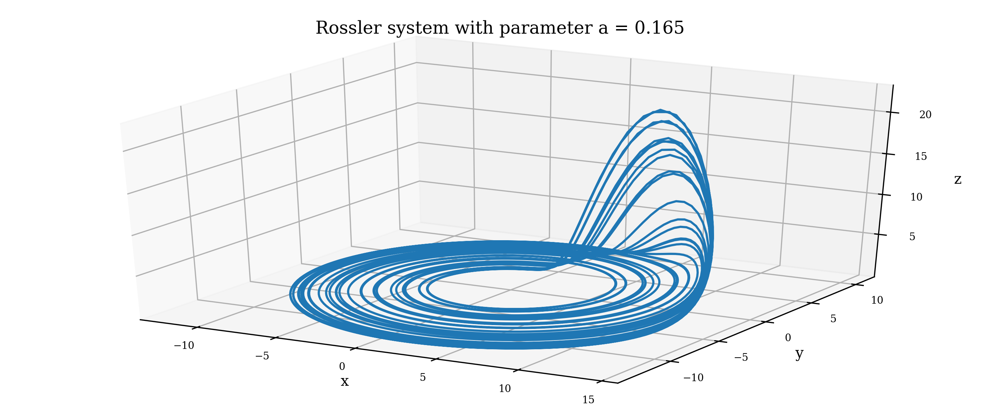

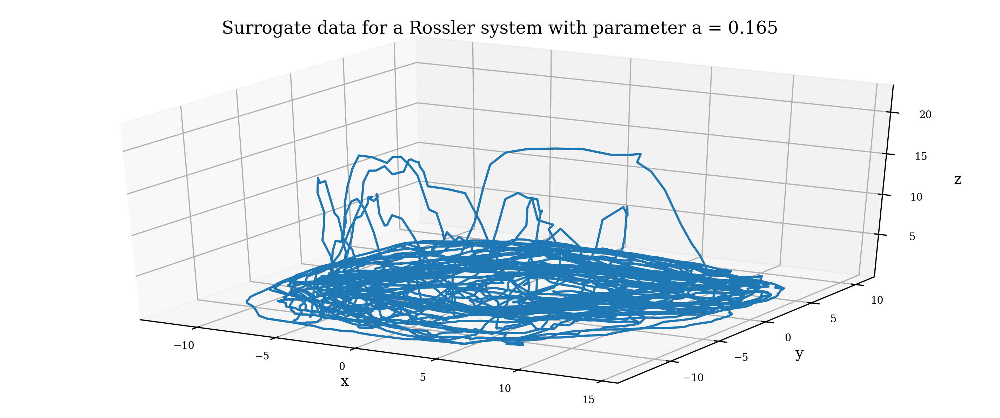

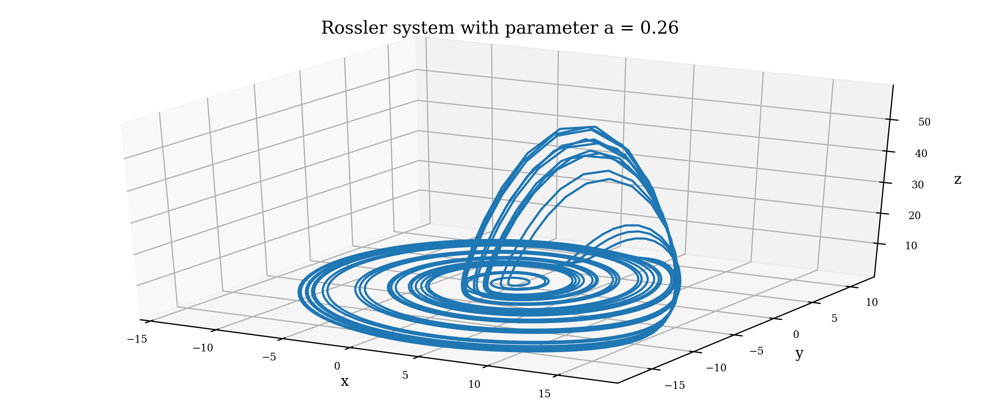

In [9]:
rA = Rossler(surrogate=True)
fig0A1, ax0A1 = rA.plot()
fig0A2, ax0A2 = rA.plot(surrogate=True)
rB = Rossler(0.26, surrogate=True)
fig0B, ax0B = rB.plot()

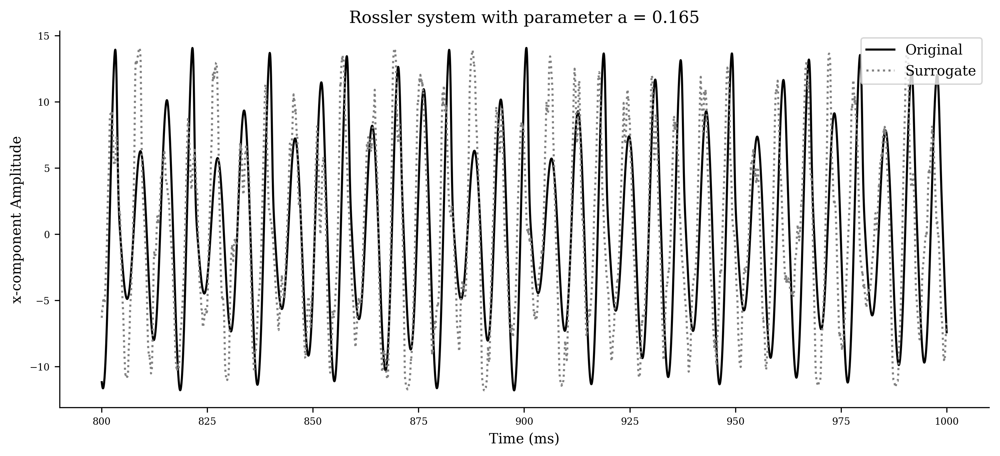

In [10]:
fig1, ax1 = rA.plot_surrogate()

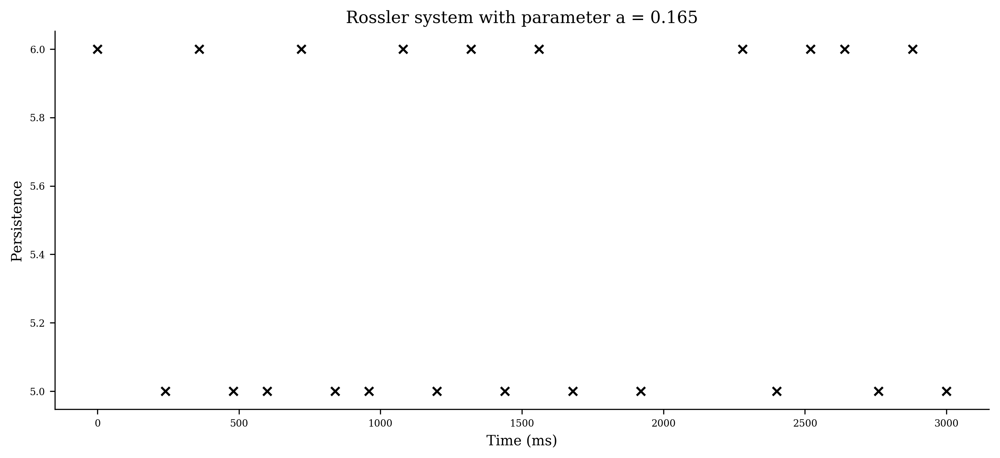

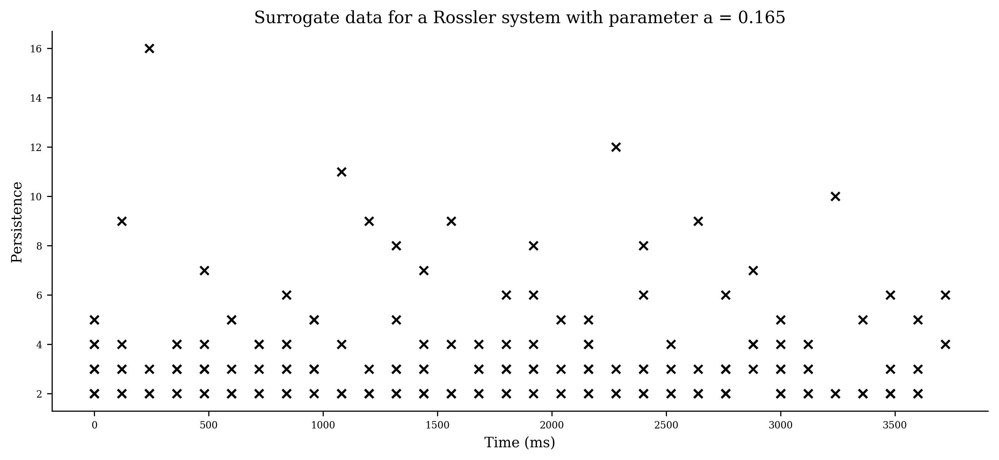

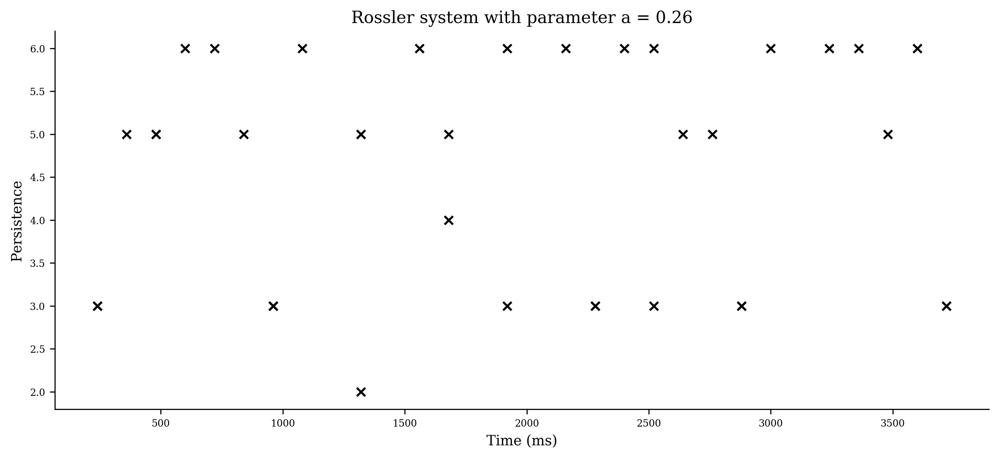

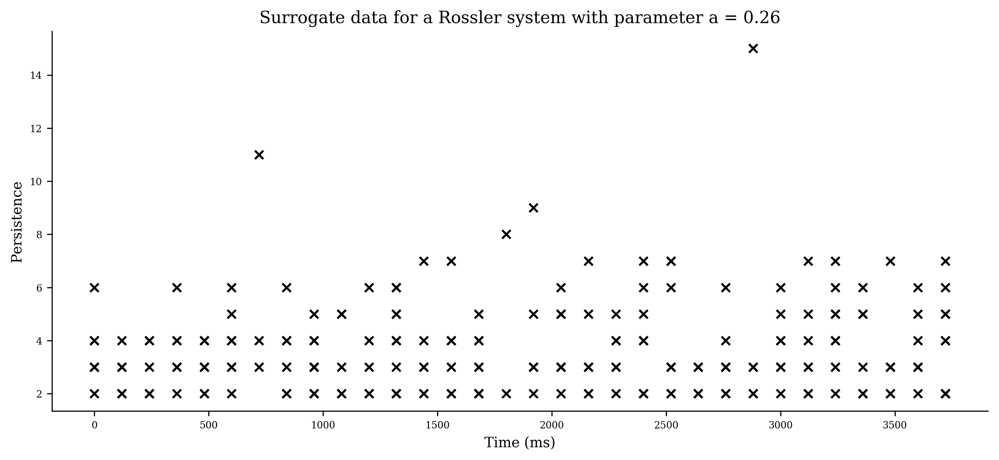

In [11]:
MA1, fig2A1, ax2A1 = rA.get_persistence()
MA2, fig2A2, ax2A2 = rA.get_persistence(surrogate=True)
MB1, fig2B1, ax2B1 = rB.get_persistence()
MB2, fig2B2, ax2B2 = rB.get_persistence(surrogate=True)

In [144]:
dontCare = 0.123
f = lambda x: Rossler(dontCare, surrogate=True, 
                      solution=x).get_persistence(surrogate=True, returnFigure=False)
epochsA, epochsB = len(rA.solution), len(rB.solution)
alphaA, pMeanA, pStdA, surrogateStatsA = SurrogateSignificance(rA.solution, f, 
                                                               winLen=epochsA, nIterations=99).get_significance(MA1)
alphaB, pMeanB, pStdB, surrogateStatsB  = SurrogateSignificance(rB.solution, f, 
                                                                winLen=epochsB, nIterations=99).get_significance(MB1)
(pMeanA, pStdA), (pMeanB, pStdB)

(((5.659433108802487e-41, True, True, True),
  (0.9999999999962849, False, False, False)),
 ((2.5844491545144356e-24, True, True, True),
  (0.9936964022860157, False, False, False)))

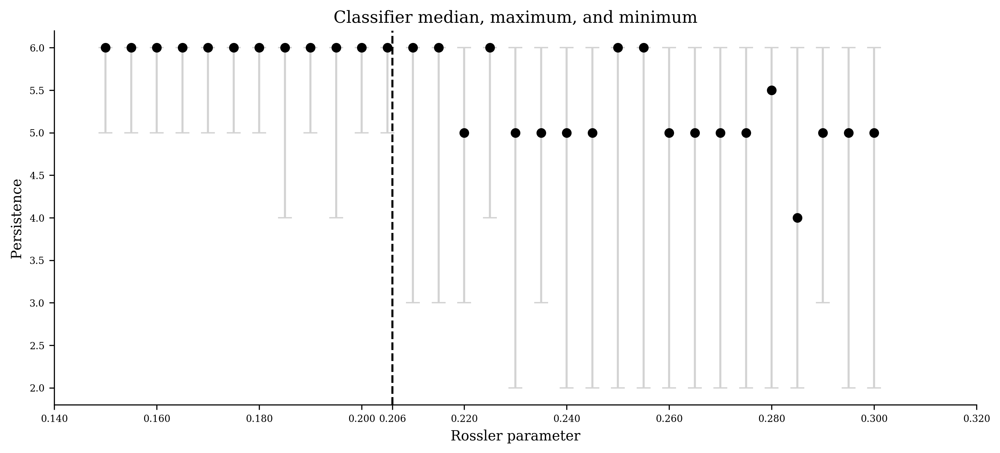

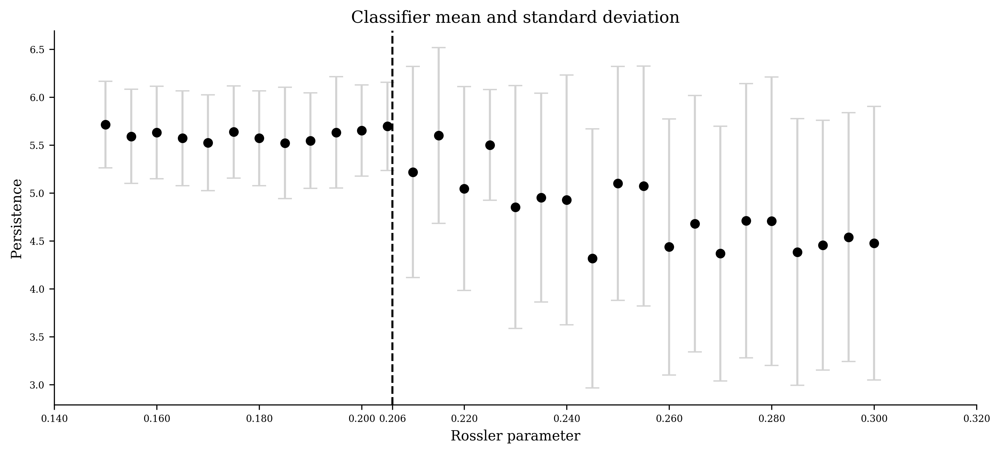

In [12]:
R = RosslerStats()
param, median, mean, std, mins, maxs = R.stats_range()
fig3A, ax3A = R.plot1(param, median, mins, maxs)
fig3B, ax3B = R.plot2(param, mean, std)

In [421]:
param1, mean1, std1 = R.split(param, mean, std, firstHalf=True) # coherent
param2, mean2, std2 = R.split(param, mean, std, firstHalf=False) # non-coherent
meanSeparation = max(mean2) - min(mean1)
stdSeparation = min(std2) - max(std1)
pMean = permutation_test(mean1[-10:], mean2[:10])
pStd = permutation_test(std1[-10:],  std2[:10])
pMean, pStd, meanSeparation, stdSeparation

(0.00012990105869362836,
 2.165017644893806e-05,
 0.07826086956521738,
 -0.003984521188651224)

(4.183808647654094, 2.0828018405701805, 4.65952380952381, 2.2372984904002844)

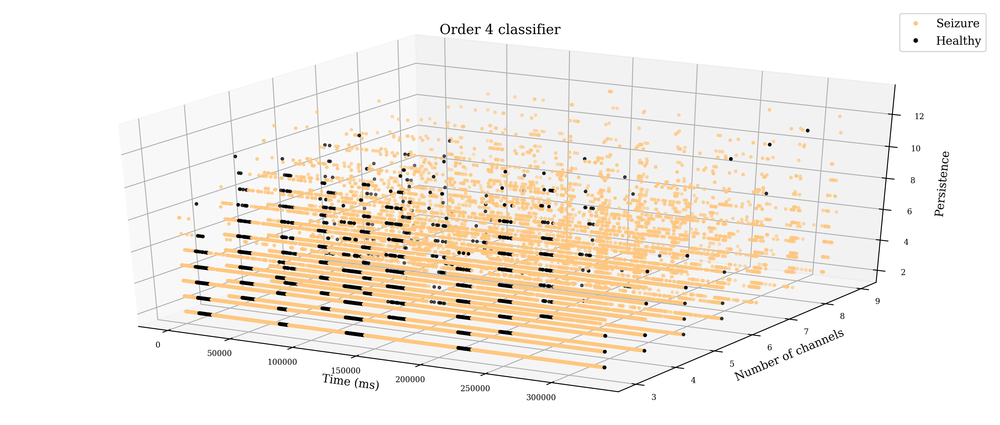

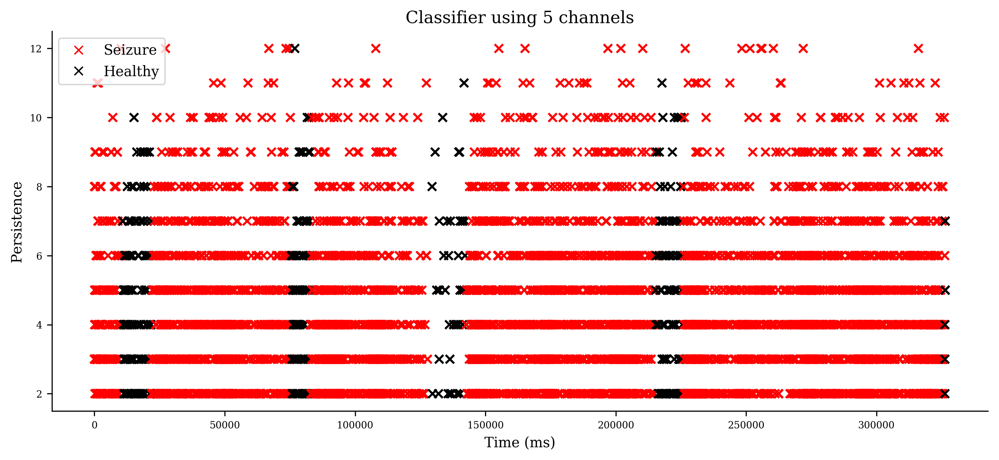

In [16]:
p4 = PhaseDiagram(eeg5[0].annotated, nChannels=9)
try:
    M4, fig4A, ax4A = p4.diagram(np.load('M4.npy', allow_pickle=False))
except:
    M4, fig4A, ax4A = p4.plot()
    np.save("M4.npy", M4, allow_pickle=False)
M4subset, fig4B, ax4B = p4.plot_subset(M4)

annot = np.array([int(p4.annotations[int(i)]) for i in M4subset.T[0]])
seizure, healthy = M4subset[annot == 1].T[2], M4subset[annot == 0].T[2]
seizureMean, seizureStd = np.mean(seizure), np.std(seizure)
healthyMean, healthyStd = np.mean(healthy), np.std(healthy)

seizureMean, seizureStd, healthyMean, healthyStd

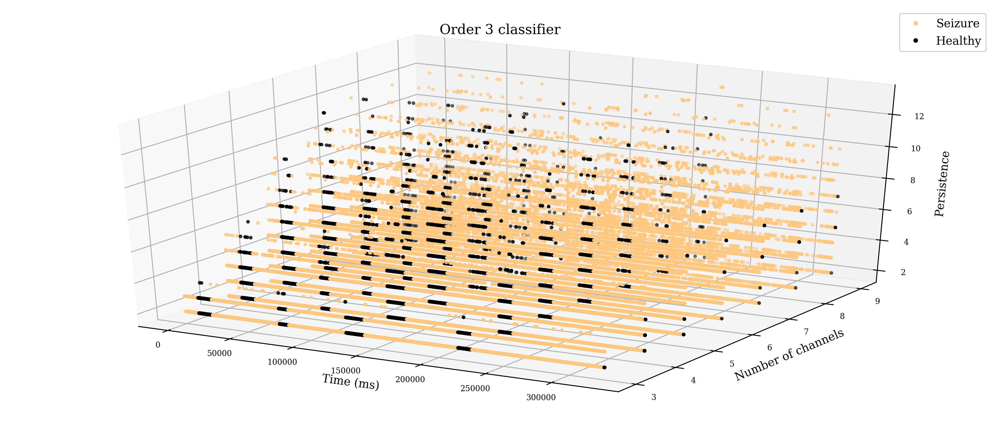

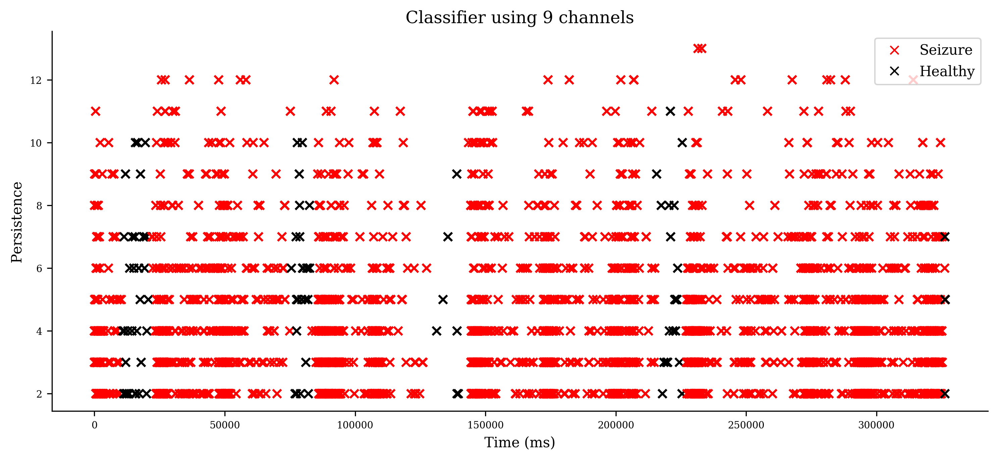

In [17]:
p3 = PhaseDiagram(eeg5[0].annotated, order=3, nChannels=9)
try:
    M3, fig5A, ax5A = p3.diagram(np.load('M3.npy', allow_pickle=False))
except:
    M3, fig5A, ax5A = p3.plot()
    np.save("M3.npy", M3, allow_pickle=False)
M3subset, fig5B, ax5B = p3.plot_subset(M3, 9)

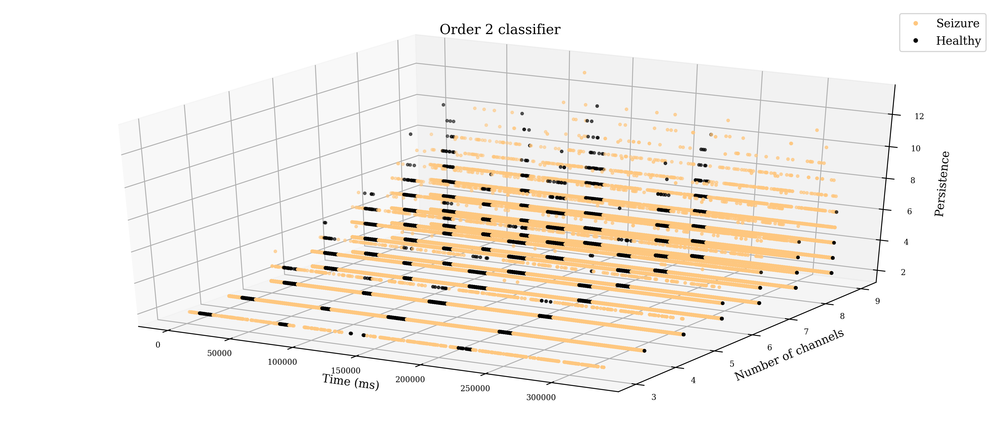

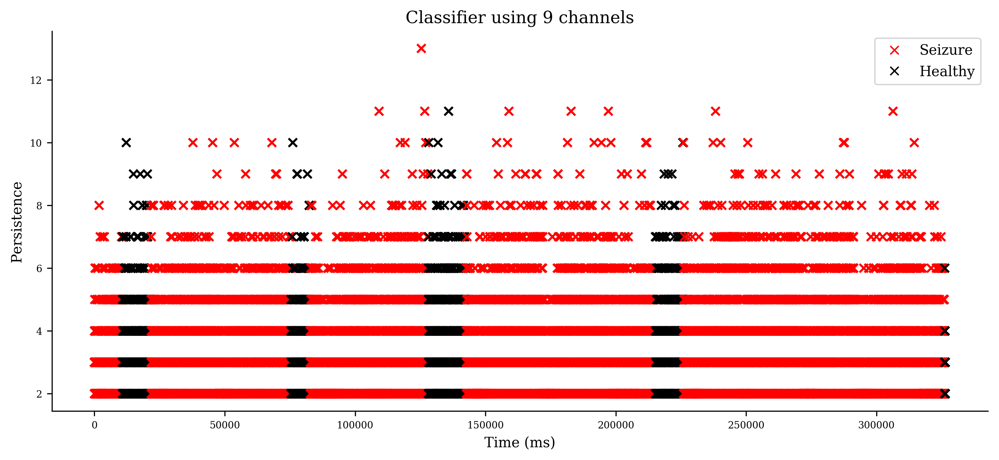

In [18]:
p2 = PhaseDiagram(eeg5[0].annotated, order=2, nChannels=9)
try:
    M2, fig6A, ax6A = p2.diagram(np.load('M2.npy', allow_pickle=False))
except:
    M2, fig6A, ax6A = p2.plot()
    np.save("M2.npy", M2, allow_pickle=False)
M2subset, fig6B, ax6B = p2.plot_subset(M2, 9)

EEG#: 1, Epoch#: 0
EEG index: 1
epochIndex index: 0
Single iteration: alpha = 0.05
Single epoch: alpha = 0.0025613787765302876
Single subject: alpha = 6.41145625580597e-05
All subjects: alpha = 2.1371977610873394e-05
p value: 0.03240468638093141
Null hypothesis rejected? (Uncorrected alpha): True
Null hypothesis rejected? (Single epoch): False
Null hypothesis rejected? (Single subject): False
Null hypothesis rejected? (All subjects): False
Time (s) to perform surrogate test:21.60174560546875
EEG#: 2, Epoch#: 0
EEG index: 2
epochIndex index: 0
Single iteration: alpha = 0.05
Single epoch: alpha = 0.0025613787765302876
Single subject: alpha = 6.41145625580597e-05
All subjects: alpha = 2.1371977610873394e-05
p value: 1.0
Null hypothesis rejected? (Uncorrected alpha): False
Null hypothesis rejected? (Single epoch): False
Null hypothesis rejected? (Single subject): False
Null hypothesis rejected? (All subjects): False
Time (s) to perform surrogate test:22.414389848709106


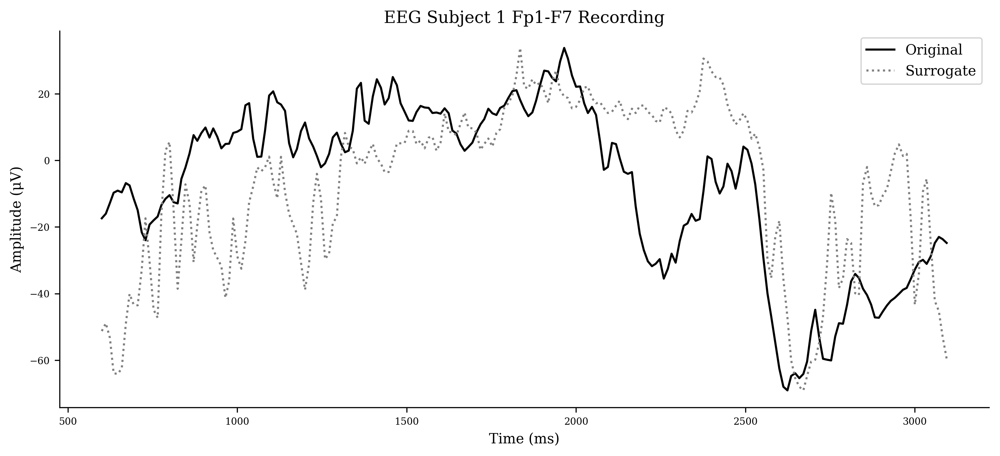

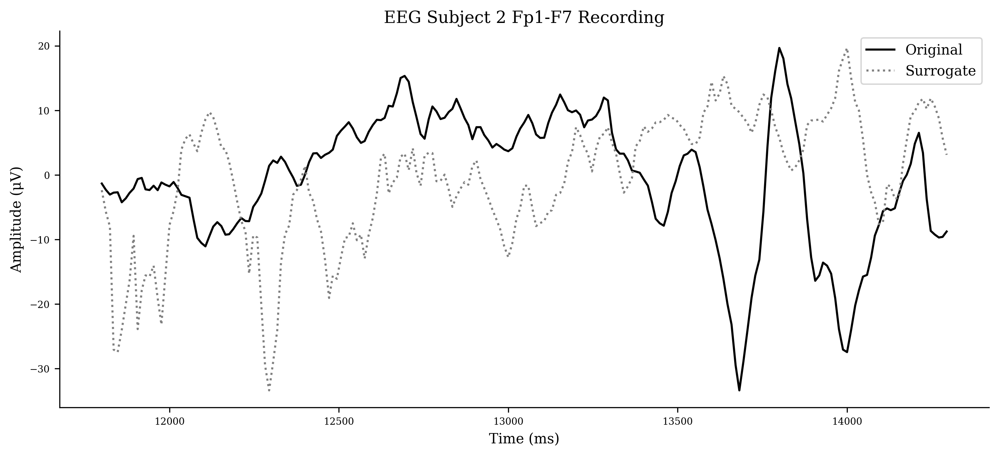

In [20]:
# For first epoch of both subjects (output is not deterministic)
MsurrogateA, fig7A, ax7A = plot_eeg_surrogate(eeg5[0].annotated, 1)
MsurrogateB, fig7B, ax7B = plot_eeg_surrogate(eeg41[0].annotated, 2)

In [3]:
try:
    results = np.load("eegResults.npy", allow_pickle=False)
except:
    results = np.array(list(starmap(eeg_surrogate_test, 
                                    get_seizure_recordings(w, w.get_templates()))))
    np.save("eegResults.npy", results, allow_pickle=False)
resultsDf = DataFrame(results)
resultsDf.columns= ['Patient ID', 'Epoch number', 'p Value']
n = len(resultsDf)
iteration     = (np.sum(resultsDf['p Value'] < 0.05)                   / n) * 100
epoch         = (np.sum(resultsDf['p Value'] < 0.0025613787765302876)  / n) * 100
singleSubject = (np.sum(resultsDf['p Value'] < 6.41145625580597e-05)   / n) * 100
allSubjects   = (np.sum(resultsDf['p Value'] < 2.1371977610873394e-05) / n) * 100
iteration, epoch, singleSubject, allSubjects

Extracting EDF parameters from eeg38.edf...
Extracting EDF parameters from eeg5.edf...
Extracting EDF parameters from eeg41.edf...
Extracting EDF parameters from eeg4.edf...
EDF file detected
EDF file detected
EDF file detected
EDF file detected
Setting channel info structure...
Setting channel info structure...
Setting channel info structure...
Creating raw.info structure...
Setting channel info structure...
Creating raw.info structure...
Creating raw.info structure...
Creating raw.info structure...
Reading 0 ... 983295  =      0.000 ...  3840.996 secs...
Reading 0 ... 1560319  =      0.000 ...  6094.996 secs...
Reading 0 ... 2479103  =      0.000 ...  9683.996 secs...
Reading 0 ... 876799  =      0.000 ...  3424.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
Setting up band-pass filter from 0.5 - 34 Hz
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth chosen to be 0.5 Hz
l_trans_bandwidth chosen to be 0.5 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwid

 131071]
Trigger channel has a non-zero initial value of 131071 (consider using initial_event=True to detect this event)
122115 events found
Event IDs: [     1      2      3      4      5      6      7      8      9     10
     11     12     13     14     15     16     17     18     19     20
     21     22     23     24     25     26     27     28     29     30
     31     32     33     34     35     36     37     38     39     40
     41     42     43     44     45     46     47     48     49     50
     51     52     53     54     55     56     57     58     59     60
     61     62     63     64     65     66     67     68     69     70
     71     72     73     74     75     76     77     78     79     80
     81     82     83     84     85     86     87     88     89     90
     91     92     93     94     95     96     97     98     99    100
    101    103    104    105    106    107    108    109    110    111
    112    113    114    115    117    118    119    120    121    

 131070 131071]
Extracting EDF parameters from eeg6.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1203967  =      0.000 ...  4702.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 8.5 Hz
Filter length of 1691 samples (6.605 sec) selected
Trigger channel has a non-zero initial value of 131067 (consider using initial_event=True to detect this event)
115939 events found
Event IDs: [     1      2      3 ... 131069 131070 131071]
Trigger channel has a non-zero initial value of 131067 (consider using initial_event=True to detect this event)
82604 events found
Event IDs: [     1      2      3 ... 131069 131070 131071]
Extracting EDF parameters from eeg8.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1180927  =      0.000 ...  4612.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth 

 131063 131064 131065 131066 131067 131068 131069 131070 131071]
Extracting EDF parameters from eeg7.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 935423  =      0.000 ...  3653.996 secs...
Setting up band-pass filter from 0.5 - 34 Hz
l_trans_bandwidth chosen to be 0.5 Hz
h_trans_bandwidth chosen to be 8.5 Hz
Filter length of 1691 samples (6.605 sec) selected
Trigger channel has a non-zero initial value of 10 (consider using initial_event=True to detect this event)
378687 events found
Event IDs: [     1      2      3 ... 131069 131070 131071]
Trigger channel has a non-zero initial value of 10 (consider using initial_event=True to detect this event)
136020 events found
Event IDs: [     1      2      3 ... 131069 131070 131071]
Extracting EDF parameters from eeg13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3946495  =      0.000 ... 15415.996 secs...
Setting up band-pass 

Trigger channel has a non-zero initial value of 1 (consider using initial_event=True to detect this event)
178507 events found
Event IDs: [     1      2      3      4      5      6      7      8      9     10
     11     12     13     14     15     16     17     18     19     20
     21     22     23     24     25     26     27     28     29     30
     31     32     33     34     35     36     37     38     39     40
     41     42     43     44     45     46     47     48     49     50
     51     52     53     54     55     56     57     58     59     60
     61     62     63     64     65     66     67     68     69     70
     71     72     73     74     75     76     77     78     79     80
     81     82     83     84     85     86     87     88     89     90
     91     92     93     94     95     96     97     98     99    100
    101    102    103    104    105    106    107    108    109    111
    112    113    114    115    116    117    118    119    120    121
    122   

p =0.009559823680648498
EEG#: 1, Epoch#: 714
p =0.21286953396820008
EEG#: 1, Epoch#: 480
p =0.0015628247613288548
EEG#: 1, Epoch#: 143
p =1.3738847839735789e-06
EEG#: 1, Epoch#: 509
p =0.999998119497031
EEG#: 1, Epoch#: 530
p =0.06093083286222501
EEG#: 1, Epoch#: 314
p =0.9999999988238755
EEG#: 1, Epoch#: 135
p =0.1492722961321139
EEG#: 1, Epoch#: 304
p =0.781874342689386
EEG#: 1, Epoch#: 789
p =0.9564915414210419
EEG#: 1, Epoch#: 830
p =0.9999998933710417
EEG#: 1, Epoch#: 695
p =6.600615593207415e-14
EEG#: 1, Epoch#: 20
p =0.10270934270664772
EEG#: 1, Epoch#: 144
p =0.9962812470937672
EEG#: 1, Epoch#: 383
p =0.9951796340191826
EEG#: 1, Epoch#: 804
p =0.00011879869094112842
EEG#: 1, Epoch#: 17
p =0.5637342373726566
EEG#: 1, Epoch#: 97
p =0.0630694618174967
EEG#: 1, Epoch#: 758
p =0.3929330850414183
EEG#: 1, Epoch#: 540
p =0.649804429970849
EEG#: 1, Epoch#: 580
p =0.9999809926999031
EEG#: 2, Epoch#: 515
p =0.9257961712288355
EEG#: 2, Epoch#: 389
p =0.8907202498098632
EEG#: 2, Epoch#: 72

(28.333333333333332,
 21.666666666666668,
 15.833333333333332,
 14.166666666666666)